### Download the Daily Soil Wetness Index (_SIM quotidienne_ - Météo-France)
This dataset includes time series of **SWI and other hydrometeorological variables** for each point of the SAFRAN grid, available at **daily resolution**. It is essential for analyzing drought dynamics and comparing against the SWI uniforme.

**Metadata in the Data Files:**
Each data file contains, in addition to the values of the climatological parameters, the following fields:

- **LAMBX**: X coordinate of the grid point in **Lambert II étendu** projection (in hectometres, hm)
- **LAMBY**: Y coordinate of the grid point in **Lambert II étendu** projection (in hectometres, hm)

> **Remark:** the CRS corresponding to _Lambert II étendu_ is _27572_, i.e., `crs='EPSG:27572'`

### Download the SWI Uniforme dataset

👉 [https://donneespubliques.meteofrance.fr/?fond=produit&id_produit=301&id_rubrique=40](https://donneespubliques.meteofrance.fr/?fond=produit&id_produit=301&id_rubrique=40)

The dataset contains:
- Monthly values of SWI uniforme,
- At the same spatial resolution as the SAFRAN grid,
- For the full French territory,
- In formats suitable for analysis (CSV, NetCDF, etc.).

## The BRGM Soil Map and Its Role in SWI Modeling

The **BRGM map** refers to the geoscientific datasets produced by the **Bureau de Recherches Géologiques et Minières** (BRGM), the French national geological survey. These datasets include detailed information about the **composition of soils** across France — particularly the **percentage of clay (argile)**, which plays a central role in soil behavior during wet and dry periods.

###  Why is the BRGM map important for SWI?

The **Soil Wetness Index (SWI)** depends on how soils retain and release water. Soils with a high clay content can **retain moisture longer**, which affects the evolution of the SWI after precipitation events. 

In contrast, the **SWI uniforme** is computed with the assumption of a **uniform soil composition across the country**, which removes local variations like those captured in the BRGM map.

As a result, the **difference between SWI and SWI uniforme** can often be explained by the local variability in soil clay content, making the BRGM map a key dataset for interpreting and modeling drought risk indicators.

###  Download Soil Clay Content Data (RGA - BRGM 2020)

You can download the official dataset showing the **percentage of clay in soils** across France from the French open data portal:

👉 [https://www.data.gouv.fr/datasets/tiles-rga-brgm-2020/](https://www.data.gouv.fr/datasets/tiles-rga-brgm-2020/)

This dataset comes from the **Référentiel Géologique de l'Argile (RGA)** and can be used to spatially join soil clay content with SWI grids or administrative units (communes, départements).

## Administrative Boundaries of France

The **administrative division of the French territory** is structured into several hierarchical levels, each serving different roles in governance, statistics, and spatial analysis. Understanding these units is essential when working with geographic data such as **SWI**, **SWI uniforme**, or **soil composition**, since analyses often need to be aggregated or compared across these boundaries.

### Main Administrative Levels

- **Commune** → The smallest administrative unit in France (over 34,000 in total). Each commune has a mayor and a local council.  
- **Arrondissement départemental** → A subdivision of a department, mainly used for administrative management.  
- **Département** → Intermediate level of governance (101 in total, including overseas). Each department has a prefect and a council.  
- **Région** → The largest administrative division (18 in total). Regions handle economic planning, transport, and regional development.  
- **Intercommunalité** (optional level) → Groupings of communes that cooperate on shared projects and services.

### The Admin Express Dataset

All these administrative layers are available in geospatial format through the **Admin Express** dataset published by the **_Institut national de l'information géographique et forestière_ (IGN)**.

This dataset provides official boundaries for:
- Communes (`COMMUNE`),
- Arrondissements (`ARRONDISSEMENT`),
- Départements (`DEPARTEMENT`),
- Régions (`REGION`),
- Intercommunalities (`EPCI`).

Each level includes identifiers compatible with **INSEE codes**, making it easy to join with demographic or environmental data.



---

## Project task, Part 1: SWI vs SWI uniforme

**Predict the SWI Uniforme** (delayed, official drought index) from the **daily SWI (Safran)** and complementary data sources such as:

- **Soil composition** (e.g., clay content from BRGM maps),
- **Geographic location** (commune polygons, coordinates),
- **Historical SWI vs SWI Uniforme pairs** for past years.


### Tasks and Research Questions

#### 1. Data Understanding & Exploratory Analysis

Before moving to prediction, your first task is to perform a **comprehensive exploratory analysis** of the available data. This should include both **quantitative** and **qualitative** insights on drought behavior across space and time.

Your goals:

#### A. Load & Prepare the Data

- Load historical **SWI (Safran)** and **SWI Uniforme** datasets.
- Load **soil composition data** (clay percentage from BRGM).
- Load **administrative boundaries** (communes, départements, régions).
- Link the SWI and SWI uniforme data to **commune polygons** and **soil maps**, so you can analyze at regional scale.

#### B. Quantitative Analysis

- Compute **summary statistics** (mean, std, min, max) for both SWI and SWI Uniforme.
- Evaluate the **temporal evolution** of SWI:
  - Identify trends across **years** (e.g., are droughts more frequent after 2010?),
  - Explore **monthly patterns** (e.g., which months are driest).
- Perform **regional aggregation** (mean SWI by region, month, or year).

#### C. Qualitative Regional Drought Insights

- Identify **which regions are most and least affected by drought**:
  - Expect **Southwest** (Bordeaux, Montpellier) to show more frequent/severe drought,
  - **Brittany** (Bretagne) likely less affected, small presence of clay in the soil (to be checked)
  - **Grand Est** may show **increasing drought trends** in recent years.
- Visualize regional variability using **choropleth maps** or **ranking plots**.

#### D. SWI vs. SWI Uniforme — Relationship Analysis

- Quantify how strongly **SWI and SWI Uniforme are correlated** (per region or grid point).
- Study the **spatial divergence**:
  - Map where the two indicators **differ the most** across France.
- Investigate how **soil properties** (e.g., clay content) **explain this divergence**:
  - Are differences larger in clay-rich soils?
  - Do differences align with regions that vary strongly in soil composition?

> This analysis will help you understand the **behavioral difference between the indicators**, which is crucial for modeling and for interpreting why a commune may or may not be declared in drought.
- Load and explore historical **SWI (Safran)** and **SWI Uniforme** datasets.
- Link the SWI grid data to **commune polygons** and **soil maps (BRGM)**.
- Compute **summary statistics** and visualize the spatial variability of both indices.

#### 2. Modeling the SWI Uniforme
- Build a predictive model (e.g., linear regression, random forest, neural network) that estimates **SWI Uniforme** from:
  - SWI (Safran),
  - Soil characteristics,
  - Climatic or geographic covariates.

- Evaluate the performance using past years where both SWI and SWI Uniforme are known.

#### 3. Interpretation & Communication
- Map and interpret areas with the largest errors.
- Discuss the **potential policy implications** (e.g., fairness in drought declarations, bias due to soil heterogeneity).
- Reflect on how this model could help anticipate **CatNat eligibility** for droughts.

---

In [1]:
import pandas as pd
import geopandas as gpd
from pathlib import Path
import matplotlib.pyplot as plt 

# --- Configuration ---
L2E_CRS = "EPSG:27572"

# Liste des fichiers Parquet à fusionner
parquet_files = [
    "meteo_1990_1999.parquet",
    "meteo_2000_2009.parquet",
    "meteo_2010_2019.parquet",
    "meteo_2020_2025.parquet"
]

# ======================================================
## 1. Load + Merge all Parquet files
# ======================================================

gdfs = []   # liste où on stocke les GeoDataFrame lues

for file in parquet_files:
    print(f"Loading {file} ...")
    try:
        # Essayer lecture directe GeoParquet
        gdf = gpd.read_parquet(file)
    except Exception:
        print(f" → GeoParquet read failed for {file}, switching to Pandas + WKB...")
        df = pd.read_parquet(file)

        if "geometry" not in df.columns:
            raise ValueError(f"Column 'geometry' missing in {file}")

        gdf = gpd.GeoDataFrame(
            df.drop(columns=["geometry"], errors="ignore"),
            geometry=gpd.GeoSeries.from_wkb(df["geometry"]),
            crs=L2E_CRS,
        )
    print(f" → {len(gdf):,} rows loaded.")
    gdfs.append(gdf)

# Fusion verticale
gdf_communes = pd.concat(gdfs, ignore_index=True)

print(f"\nTotal merged rows: {len(gdf_communes):,}")

# ======================================================
## 2. Data preparation
# ======================================================

# Exemple : nettoyage de la colonne T (température ?)
if "T" in gdf_communes.columns:
    gdf_communes["T"] = pd.to_numeric(gdf_communes["T"], errors="coerce")

# Pour la suite du code
df = gdf_communes

# Détection automatique colonnes SWI
swi_cols = list(df.columns)
print("\nColonnes détectées :", swi_cols)


Loading meteo_1990_1999.parquet ...
 → 36,165,756 rows loaded.
Loading meteo_2000_2009.parquet ...
 → 36,175,659 rows loaded.
Loading meteo_2010_2019.parquet ...
 → 36,165,756 rows loaded.
Loading meteo_2020_2025.parquet ...
 → 21,103,293 rows loaded.

Total merged rows: 129,610,464

Colonnes détectées : ['LAMBX', 'LAMBY', 'DATE', 'PRENEI', 'PRELIQ', 'T', 'FF', 'Q', 'DLI', 'SSI', 'HU', 'EVAP', 'ETP', 'PE', 'SWI', 'SSWI_10J', 'DRAINC', 'RUNC', 'RESR_NEIGE', 'RESR_NEIGE6', 'HTEURNEIGE', 'HTEURNEIGE6', 'HTEURNEIGEX', 'SNOW_FRAC', 'ECOULEMENT', 'WG_RACINE', 'WGI_RACINE', 'TINF_H', 'TSUP_H', 'LAT_DG', 'LON_DG', 'YYYYMM', 'SWI_UNIF_MENS', 'geometry', 'INSEE_COM', 'NOM_COM', 'dist_m_commune', 'index_right', 'nom_officiel']


In [2]:
df['DATE'] = pd.to_datetime(df['DATE'], errors='coerce')
df['YEAR'] = df['DATE'].dt.year


In [3]:
stats_year = (
    df.groupby('YEAR')[['SWI', 'SWI_UNIF_MENS']]
      .agg(['mean', 'std', 'min', 'max'])
)

stats_year


SWI                         SWI_UNIF_MENS                        
          mean       std    min    max          mean       std    min    max
YEAR                                                                        
1990  0.587172  0.284362 -0.039  2.087      0.493778  0.320256 -0.035  1.538
1991  0.636198  0.270337 -0.025  1.801      0.572729  0.328815 -0.038  1.511
1992  0.696464  0.248198 -0.026  1.965      0.630314  0.294813 -0.035  1.523
1993  0.698772  0.234246 -0.035  1.787      0.664682  0.276448 -0.040  1.530
1994  0.734982  0.265659 -0.024  1.978      0.682771  0.323625 -0.036  1.527
1995  0.666134  0.289520 -0.030  2.067      0.588927  0.348915 -0.034  1.541
1996  0.655262  0.286898 -0.031  2.027      0.576052  0.336914 -0.031  1.524
1997  0.637893  0.256102 -0.030  2.005      0.549555  0.303368 -0.030  1.540
1998  0.679935  0.264987 -0.025  1.947      0.611803  0.319745 -0.031  1.535
1999  0.727963  0.262401 -0.025  2.242      0.664909  0.314097 -0.040  1.541
2000  0.744598  0.248203 -0.029  2.183      0.698053  0.305897 -0.034  1.531
2001  0.719043  0.272274 -0.036  1.921      0.653241  0.340113 -0.042  1.540
2002  0.685399  0.260390 -0.021  2.026      0.603146  0.310017 -0.023  1.512
2003  0.578670  0.306498 -0.035  1.862      0.515489  0.359366 -0.040  1.537
2004  0.644194  0.271204 -0.026  2.101      0.572824  0.327529 -0.036  1.523
2005  0.584920  0.275322 -0.030  2.025      0.492683  0.329045 -0.042  1.518
2006  0.647219  0.275949 -0.061  2.271      0.560160  0.321628 -0.048  1.491
2007  0.655151  0.252354 -0.051  1.861      0.574256  0.314761 -0.041  1.539
2008  0.696932  0.250345 -0.029  2.127      0.621858  0.309731 -0.037  1.532
2009  0.608430  0.277896 -0.035  2.075      0.529801  0.337482 -0.040  1.538
2010  0.667205  0.281076 -0.025  1.956      0.591978  0.333109 -0.032  1.501
2011  0.565339  0.277186 -0.023  2.055      0.476891  0.331049 -0.029  1.523
2012  0.686200  0.252882 -0.030  1.910      0.618496  0.300811 -0.039  1.536
2013  0.742079  0.258575 -0.028  1.966      0.686742  0.318578 -0.036  1.536
2014  0.705083  0.251376 -0.023  1.939      0.645055  0.308690 -0.041  1.529
2015  0.619052  0.267445 -0.025  1.969      0.542719  0.328783 -0.036  1.532
2016  0.673689  0.276866 -0.045  1.810      0.597343  0.337700 -0.043  1.535
2017  0.592418  0.257850 -0.065  2.028      0.493104  0.306430 -0.049  1.494
2018  0.643967  0.306248 -0.026  2.006      0.571331  0.371891 -0.032  1.539
2019  0.637729  0.290530 -0.079  1.827      0.573471  0.340150 -0.043  1.444
2020  0.629428  0.291216 -0.043  1.844      0.572186  0.346845 -0.037  1.391
2021  0.680714  0.238548 -0.026  1.954      0.613674  0.293696 -0.041  1.443
2022  0.534096  0.291908 -0.045  1.972      0.452467  0.339432 -0.040  1.358
2023  0.643535  0.288579 -0.027  1.740      0.573392  0.343611 -0.032  1.446
2024  0.760149  0.235042 -0.024  1.688      0.717298  0.291579 -0.034  1.387
2025  0.587805  0.299352 -0.029  1.786           NaN       NaN    NaN    NaN

In [4]:
import matplotlib.pyplot as plt

In [5]:
gdf_yearly = (
    df.groupby(['YEAR', 'INSEE_COM'], as_index=False)  # ou autre identifiant communal
      .agg({'SWI': 'mean'})
)

# On réassocie la géométrie
gdf_yearly = gdf_yearly.merge(
    df[['INSEE_COM', 'geometry']].drop_duplicates(),
    on='INSEE_COM',
    how='left'
)

gdf_yearly = gpd.GeoDataFrame(gdf_yearly, geometry='geometry', crs=df.crs)


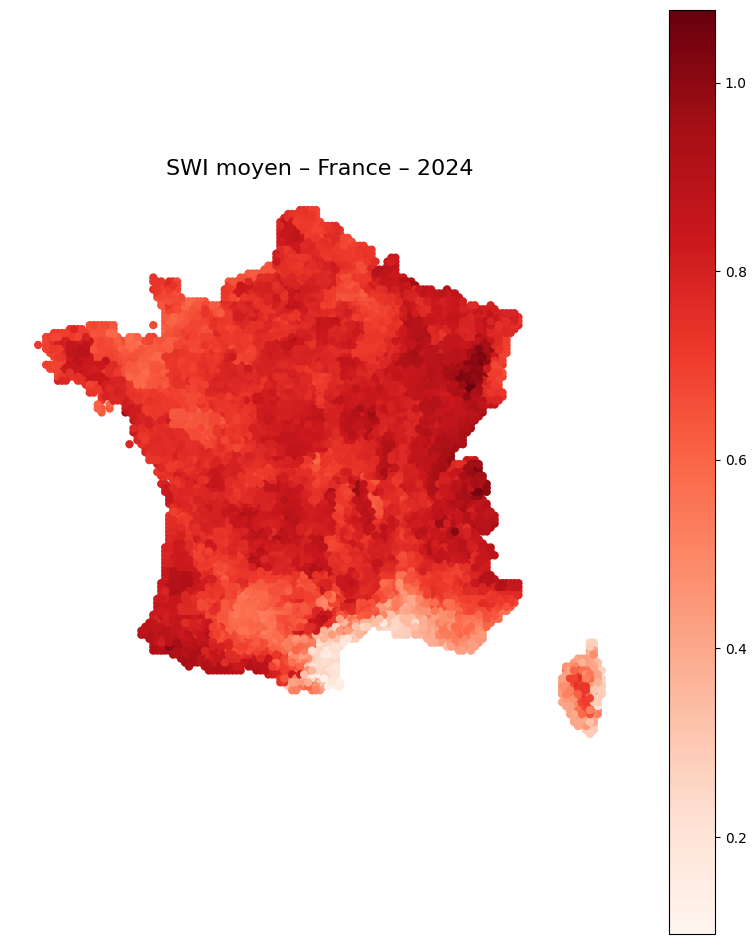

In [6]:
import matplotlib.pyplot as plt

annee = 2024
gdf_plot = gdf_yearly[gdf_yearly['YEAR'] == annee]


fig, ax = plt.subplots(1, 1, figsize=(10, 12))
gdf_plot.plot(
    column='SWI',
    cmap='Reds',
    linewidth=0,
    legend=True,
    ax=ax,
    missing_kwds={'color': 'lightgrey'}
)

ax.set_title(f"SWI moyen – France – {annee}", fontsize=16)
ax.axis('off')

plt.show()


In [3]:
df['MONTH'] = df['DATE'].dt.month

In [7]:
df['YEAR'] = df['DATE'].dt.year
df['MONTH'] = df['DATE'].dt.month

In [8]:
gdf_monthly = (
    df.groupby(['YEAR', 'MONTH', 'INSEE_COM'], as_index=False)
      .agg({'SWI': 'mean'})
)

# Réassocier la géométrie
gdf_monthly = gdf_monthly.merge(
    df[['INSEE_COM', 'geometry']].drop_duplicates(),
    on='INSEE_COM',
    how='left'
)

gdf_monthly = gpd.GeoDataFrame(gdf_monthly, geometry='geometry', crs=df.crs)


In [9]:
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider

# --- Filtrer uniquement 2024 ---
gdf_2001 = gdf_monthly[gdf_monthly['YEAR'] == 2001]

def plot_swi_2001(month):
    gdf_plot = gdf_2001[gdf_2001['MONTH'] == month]

    fig, ax = plt.subplots(1, 1, figsize=(10, 12))
    gdf_plot.plot(
        column='SWI',
        cmap='Blues',
        linewidth=0,
        legend=True,
        ax=ax,
        missing_kwds={'color': 'lightgrey'}
    )

    ax.set_title(f"SWI moyen – 2001-{month:02d}", fontsize=16)
    ax.axis('off')

    plt.show()


months_2001 = sorted(gdf_2001['MONTH'].unique())

interact(
    plot_swi_2001,
    month = IntSlider(min=min(months_2001), 
                      max=max(months_2001), 
                      step=1, 
                      value=min(months_2001))
)


interactive(children=(IntSlider(value=1, description='month', max=12, min=1), Output()), _dom_classes=('widget…

<function __main__.plot_swi_2001(month)>

In [ ]:
from rapidfuzz import process, fuzz
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd

# ================================
# Fonction : SWI par région pour une année donnée
# ================================
def compute_swi_region_for_year(df, year):
    print(f"\n==============================")
    print(f"  Traitement SWI pour {year} ")
    print(f"==============================")

    # Filtrer l’année
    df_year = df[df['YEAR'] == year].copy()
    print(f" → {len(df_year):,} lignes pour l'année {year}")

    # Vérification
    if df_year.empty:
        print(f"⚠️ Aucune donnée pour {year}")
        return None

    # -------------------------------
    # 1. Fuzzy matching
    # -------------------------------
    print("Fuzzy matching des noms…")

    names_source = df_year['nom_officiel'].dropna().unique().tolist()
    names_target = df['nom_officiel'].dropna().unique().tolist()

    name_map = {}

    for name in names_source:
        match, score, _ = process.extractOne(
            name,
            names_target,
            scorer=fuzz.WRatio
        )
        name_map[name] = match

    df_year["nom_officiel_matched"] = df_year["nom_officiel"].map(name_map)

    # -------------------------------
    # 2. SWI moyen par région
    # -------------------------------
    gdf_region = (
        df_year.groupby("nom_officiel_matched", as_index=False)
               .agg({"SWI": "mean"})
               .rename(columns={"nom_officiel_matched": "nom_officiel"})
    )

    # -------------------------------
    # 3. Merge avec géométrie
    # -------------------------------
    gdf_region = gdf_region.merge(
        df[['nom_officiel', 'geometry']].drop_duplicates('nom_officiel'),
        on='nom_officiel',
        how='left'
    )

    # Conversion GeoDataFrame
    gdf_region = gpd.GeoDataFrame(
        gdf_region,
        geometry='geometry',
        crs=df.crs
    )

    return gdf_region


# ================================
# Générer les cartes pour 2000 + 2024
# ================================

years_to_process = [2000, 2024]

for year in years_to_process:

    gdf_region = compute_swi_region_for_year(df, year)

    if gdf_region is None:
        continue

    # -------------------------------
    # 4. Carte
    # -------------------------------
    fig, ax = plt.subplots(1, 1, figsize=(12, 10))

    gdf_region.plot(
        column='SWI',
        cmap='YlGnBu',
        linewidth=0.8,
        ax=ax,
        edgecolor='black',
        legend=True,
        legend_kwds={
            'label': f"SWI moyen - année {year}",
            'orientation': "horizontal"
        }
    )

    ax.set_title(f"SWI moyen par région - {year}", fontsize=16)
    ax.axis('off')

    plt.show()


# Partie chacha
## Corrélation

In [5]:
df.groupby("INSEE_COM")[["SWI", "SWI_UNIF_MENS"]].corr().unstack()

SWI               SWI_UNIF_MENS              
           SWI SWI_UNIF_MENS           SWI SWI_UNIF_MENS
INSEE_COM                                               
01006      1.0      0.932311      0.932311           1.0
01010      1.0      0.934892      0.934892           1.0
01013      1.0      0.926151      0.926151           1.0
01025      1.0      0.941839      0.941839           1.0
01033      1.0      0.942241      0.942241           1.0
...        ...           ...           ...           ...
95446      1.0      0.942227      0.942227           1.0
95504      1.0      0.951336      0.951336           1.0
95555      1.0      0.924433      0.924433           1.0
95625      1.0      0.932908      0.932908           1.0
95652      1.0      0.949063      0.949063           1.0

[8305 rows x 4 columns]

In [3]:
df_communes = df.groupby("INSEE_COM")[["SWI", "SWI_UNIF_MENS"]].mean()
df_communes["corr"] = df.groupby("INSEE_COM")[["SWI","SWI_UNIF_MENS"]].corr().iloc[0::2, -1].values

df_communes.head()

,SWI,SWI_UNIF_MENS,corr
INSEE_COM,,,
01006,0.827999,0.827806,0.932311
01010,0.821425,0.823001,0.934892
01013,0.846844,0.839006,0.926151
01025,0.704989,0.646208,0.941839
01033,0.769408,0.740821,0.942241


In [5]:
df_communes.shape

(8305, 3)

### Carte corrélation

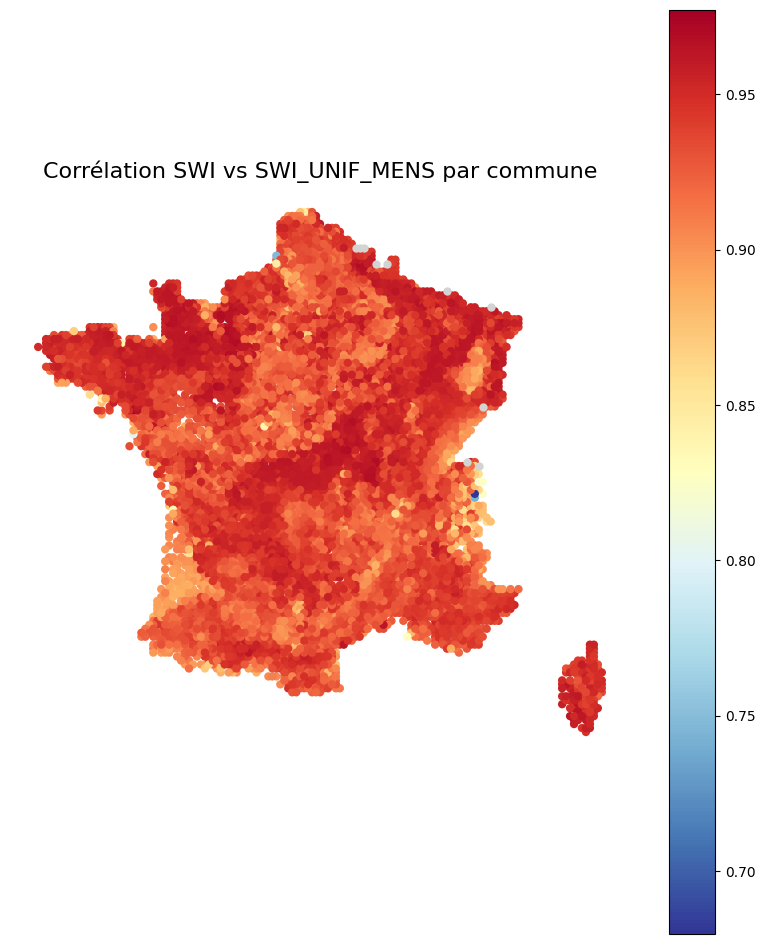

In [10]:
# Carte de la corrélation SWI vs SWI_UNIF_MENS par commune

df_corr = df_communes.reset_index()  

df_geo = df[['INSEE_COM', 'geometry']].drop_duplicates(subset='INSEE_COM')

gdf_corr = df_corr.merge(df_geo, on='INSEE_COM', how='left')

gdf_corr = gpd.GeoDataFrame(gdf_corr, geometry='geometry', crs=df.crs)

fig, ax = plt.subplots(1, 1, figsize=(10, 12))

gdf_corr.plot(
    column='corr',
    cmap='RdYlBu_r',          
    linewidth=0,
    legend=True,
    ax=ax,
    missing_kwds={'color': 'lightgrey'}
)

ax.set_title("Corrélation SWI vs SWI_UNIF_MENS par commune", fontsize=16)
ax.axis('off')

plt.show()



# Carte intéractive

In [ ]:
# Carte intéractive 
if "NOM_COM_x" in gdf_corr.columns and "NOM_COM_y" in gdf_corr.columns:
    gdf_corr["NOM_COM"] = gdf_corr["NOM_COM_x"].fillna(gdf_corr["NOM_COM_y"])
    gdf_corr = gdf_corr.drop(columns=["NOM_COM_x", "NOM_COM_y"])


gdf_corr_wgs = gdf_corr.to_crs(epsg=4326)

m = gdf_corr_wgs.explore(
    column="corr",
    cmap="RdYlBu_r",
    tiles="CartoDB positron",
    tooltip=["INSEE_COM", "NOM_COM", "corr"],
    popup=True,
    style_kwds={"opacity": 0.8, "fillOpacity": 0.8},
)

m  


## Dirvergence spatiale

In [3]:
df["DIFF"] = df["SWI"] - df["SWI_UNIF_MENS"]

diff_map = df.groupby("INSEE_COM")["DIFF"].mean().reset_index(name="DIFF_MEAN")
std_map  = df.groupby("INSEE_COM")["DIFF"].std().reset_index(name="DIFF_STD")

In [5]:
df_geo = df[["INSEE_COM", "geometry"]].drop_duplicates(subset="INSEE_COM")

gdf_diff = diff_map.merge(std_map, on="INSEE_COM")
gdf_diff = gdf_diff.merge(df_geo, on="INSEE_COM", how="left")

import geopandas as gpd
gdf_diff = gpd.GeoDataFrame(gdf_diff, geometry="geometry", crs=df.crs)

In [6]:
gdf_diff.head()

,INSEE_COM,DIFF_MEAN,DIFF_STD,geometry
0,01006,0.002866,0.108858,POINT (852000 2089000)
1,01010,-0.000501,0.108017,POINT (868000 2105000)
2,01013,0.010446,0.112665,POINT (844000 2105000)
3,01025,0.059935,0.107287,POINT (804000 2153000)
4,01033,0.030541,0.107888,POINT (868000 2129000)


### Carte divergence moyenne

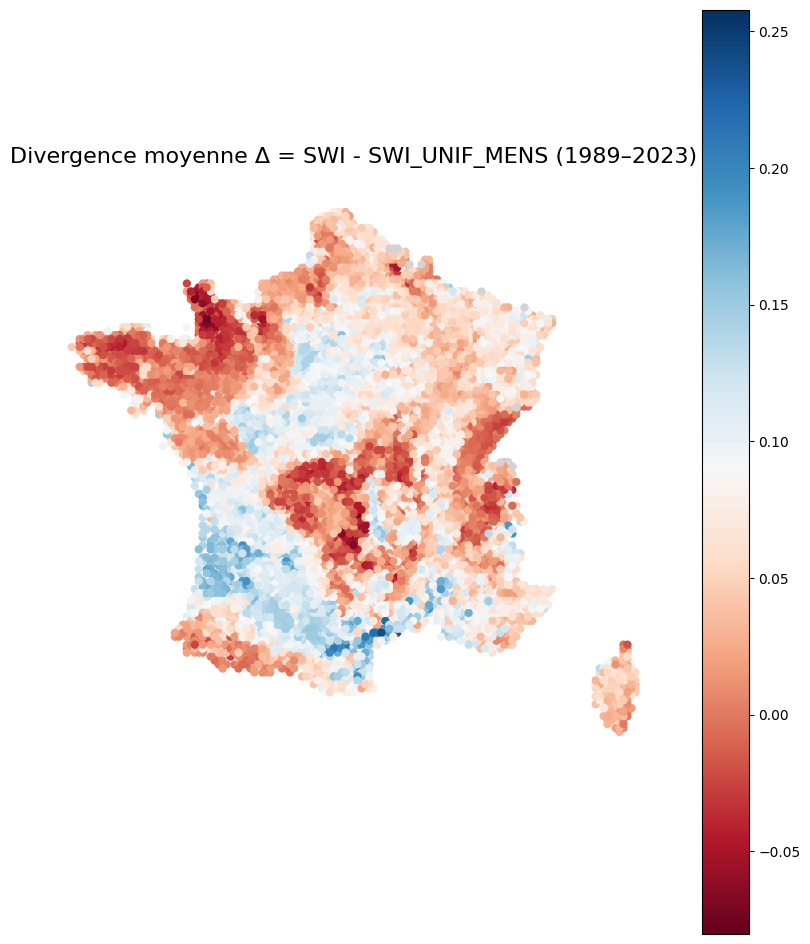

In [8]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 12))

gdf_diff.plot(
    column="DIFF_MEAN",
    cmap="RdBu",            # rouge = SWI >> SWI_UNIF ; bleu = SWI_UNIF >> SWI
    legend=True,
    linewidth=0,
    ax=ax,
    missing_kwds={"color": "lightgrey"}
)

ax.set_title("Divergence moyenne Δ = SWI - SWI_UNIF_MENS (1989–2023)", fontsize=16)
ax.axis("off")

plt.show()

In [ ]:
# Communes qui divergent le plus en moyenne
gdf_diff.nlargest(20, "DIFF_MEAN")[["INSEE_COM", "DIFF_MEAN"]]

,INSEE_COM,DIFF_MEAN
916,11158,0.257804
3124,33047,0.241538
3336,34325,0.240637
3279,34108,0.233398
6363,66164,0.231934
3313,34239,0.222258
898,11069,0.220009
919,11167,0.219875
3333,34310,0.218232
953,11330,0.214980


### Carte intéractive

In [10]:
gdf_diff_wgs = gdf_diff.to_crs(epsg=4326)

m = gdf_diff_wgs.explore(
    column="DIFF_MEAN",
    cmap="RdBu",
    tooltip=["INSEE_COM", "DIFF_MEAN", "DIFF_STD"],
    tiles="CartoDB positron",
    legend=True
)

m


### Carte divergence instable

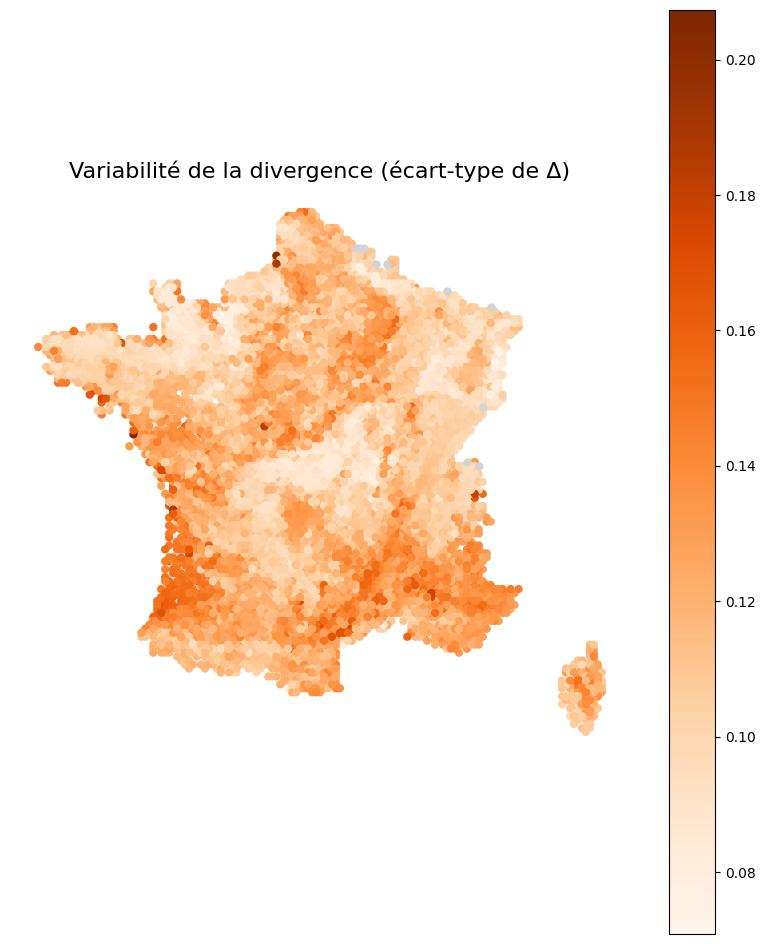

In [9]:
fig, ax = plt.subplots(figsize=(10, 12))

gdf_diff.plot(
    column="DIFF_STD",
    cmap="Oranges",
    legend=True,
    linewidth=0,
    ax=ax,
    missing_kwds={"color": "lightgrey"}
)

ax.set_title("Variabilité de la divergence (écart-type de Δ)", fontsize=16)
ax.axis("off")

plt.show()


In [ ]:
# Communes les plus instables 
gdf_diff.nlargest(20, "DIFF_STD")[["INSEE_COM", "DIFF_STD"]]

### Carte intéractive

In [11]:
m2 = gdf_diff_wgs.explore(
    column="DIFF_STD",
    cmap="Oranges",
    tooltip=["INSEE_COM", "DIFF_MEAN", "DIFF_STD"],
    tiles="CartoDB positron",
    legend=True
)

m2


# Modèles

## Modèle 1 : Random Forest + sin/cos + hydrométéo + spatial

In [4]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

df["mois"] = df["DATE"].dt.month
df["sin_mois"] = np.sin(2*np.pi*df["mois"]/12)
df["cos_mois"] = np.cos(2*np.pi*df["mois"]/12)

features = [
    # Hydrologie / climat
    "PRENEI", "PRELIQ", "T", "EVAP", "ETP", "PE",
    "SWI", "SSWI_10J", "DRAINC", "RUNC", "ECOULEMENT",
    "WG_RACINE", "WGI_RACINE", "HU", "FF", "Q", "DLI",
    "RESR_NEIGE", "RESR_NEIGE6", "HTEURNEIGE", "HTEURNEIGE6",
    "HTEURNEIGEX", "SNOW_FRAC", "TINF_H", "TSUP_H",

    # Localisation
    "LAT_DG", "LON_DG", "dist_m_commune",

    # Saisonnalité athmosphérique selon Wilks et Shumway & Stoffer
    "mois", "sin_mois", "cos_mois"
]

In [5]:
# 1) Colonnes nécessaires pour le modèle
cols_model = features + ["SWI_UNIF_MENS", "YEAR"]  # + autres si besoin (INSEE_COM, etc.)

# 2) On ne garde QUE ces colonnes (donc pas geometry → plus léger)
df_model = df[cols_model].copy()

# 3) On drop les lignes avec NA sur les features ou la cible
df_model = df_model.dropna(subset=features + ["SWI_UNIF_MENS"])

# 4) X et y
X = df_model[features]
y = df_model["SWI_UNIF_MENS"]

# (optionnel) alléger en float32 pour la RAM
num_cols = X.columns
X[num_cols] = X[num_cols].astype("float32")
y = y.astype("float32")

: 

In [ ]:
# Train/test split
train = df_model["YEAR"] <= 2018 # 80/20 
test  = df_model["YEAR"] > 2018

X_train, X_test = X[train], X[test]
y_train, y_test = y[train], y[test]

In [ ]:
# RF Regressor 
rf = RandomForestRegressor(
    n_estimators=300,
    max_depth=None,
    min_samples_leaf=2,
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train, y_train)

In [ ]:
# Prédiction + métriques 
y_pred = rf.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae  = mean_absolute_error(y_test, y_pred)
r2   = r2_score(y_test, y_pred)

print("Performance du modèle Random Forest :")
print(f"  RMSE = {rmse:.4f}")
print(f"  MAE  = {mae:.4f}")
print(f"  R²   = {r2:.4f}")

In [ ]:
# Graphique : Observé vs Prédit
plt.figure(figsize=(6,6))
plt.scatter(y_test, y_pred, alpha=0.3)
plt.xlabel("SWI_UNIF_MENS observé")
plt.ylabel("SWI_UNIF_MENS prédit")
plt.title("Prédiction du SWI uniforme — Random Forest")
plt.plot([0,1],[0,1], color='red')
plt.show()

In [ ]:
# Importance des variables 
importances = pd.DataFrame({
    "feature": features,
    "importance": rf.feature_importances_
}).sort_values("importance", ascending=False)

plt.figure(figsize=(8,10))
plt.barh(importances["feature"], importances["importance"])
plt.gca().invert_yaxis()
plt.title("Importance des variables — Random Forest")
plt.show()

importances

In [ ]:
# Carte des erreurs moyennes par commune
df_model["y_pred"] = rf.predict(X)
df_model["residual"] = df_model["SWI_UNIF_MENS"] - df_model["y_pred"]

df_res = df_model.groupby("INSEE_COM")["residual"].mean().reset_index()
df_geo = df[["INSEE_COM", "geometry"]].drop_duplicates()

gdf_res = df_res.merge(df_geo, on="INSEE_COM")
gdf_res = gpd.GeoDataFrame(gdf_res, geometry="geometry", crs=df.crs)

gdf_res.plot(column="residual", cmap="RdBu", legend=True, figsize=(10,12))
plt.title("Erreur moyenne du modèle par commune")
plt.axis("off")
plt.show()

Piste d'amélioration : 

⭐ Ajouter les variables de sol BRGM : %ARGILE, %LIMON, %SABLE, PERMEABILITÉ
→ Les modèles s’améliorent beaucoup, car SWI_UNIF est basé sur un sol uniforme.

⭐ Ajouter des lags SWI(t-1), pluie(t-1)
Très utile pour les forêts aléatoires.

⭐ Tester LightGBM = généralement le meilleur modèle pour données environnementales

⭐ Modèle global vs modèles régionaux
Mieux encore : entraîner un modèle par grande région climatique (Nord, Ouest, Sud-Est…).



## Project task, Part 2: Defining and Predicting Extreme Drought Using SWI Uniforme

In this project, we aim to predict whether a location (commune or grid cell) will experience an **extreme geotechnical drought**, based on **SWI uniforme** values. The challenge is to simulate the eligibility rules used by the **interministerial commission** (CatNat) — which are based not on fixed values, but on **statistical thresholds**.

We will approach this problem in **three steps**, using increasingly realistic definitions of drought:

### 1. Drought Definition Using the 25% Quantile

We begin by computing the **25th percentile (Q1)** of historical SWI uniforme values for each location and quarter (e.g., Q2: April–June).  
Any year where the SWI uniforme falls **below this 25% threshold** is marked as an **extreme drought**.

> This first task defines drought in a broad sense and helps initialize your binary classification model.


### 2. Drought Definition Using the 5% Quantile

Next, we apply a **stricter criterion**: we compute the **5th percentile** of SWI uniforme for each location and quarter.  
Years below this threshold are classified as **very extreme droughts**.

> This step simulates rare but impactful events, refining your model's sensitivity to extreme low moisture conditions.


### 3. Official Rule (“Règle Métier”) from Météo-France

Finally, we implement the official drought definition from the **Météo-France 2019 report**:

> *“On considère que la durée de retour de la sécheresse géotechnique est supérieure ou égale à 25 ans si l’indicateur du trimestre considéré se classe au 1er ou au 2ᵉ rang parmi les indicateurs calculés sur les 50 dernières années pour ce trimestre.”*

Translated: A **drought event** is defined when the **SWI uniforme** for a quarter is among the **two lowest values over the past 50 years** — corresponding to a **return period of at least 25 years**.

📄 Full report:  
👉 [Météo-France, Rapport 2019 — Sécheresse géotechnique](https://meteofrance.fr/sites/meteofrance.fr/files/files/editorial/RapportM%C3%A9t%C3%A9orologique_CatNat-S%C3%A9cheresse_2019-2-compressed%20%281%29.pdf)

> This is the most realistic and policy-relevant definition. Your final binary label will be:
> - `1` if the SWI uniforme is in the **lowest 2 values** over 50 years,
> - `0` otherwise.


#### Prediction Task Summary

You will build and evaluate **binary classification models** using these different drought definitions as targets.  
Your predictors may include:
- **SWI (Safran)** values,
- **Soil clay content** (BRGM),
- **Geographic location** or grid cell ID,
- **Temporal features** (e.g., month, year, quarter).

This stepwise approach lets you explore how different drought definitions affect model performance and policy relevance.

## What It Is Expected

Your final submission should include **both analytical and technical components**, combining a clear presentation of findings with a well-documented implementation.

### 1. Written Report

We expect a concise report. It should look like something like this:

👉 [France Assureurs – Master Class Sécheresse (Oct. 2023)](https://www.franceassureurs.fr/master-class-secheresse/pdf/20231017%20Master%20class%20Secheresse.pdf)

The report should:
- Summarize the goals, methods, and key findings of your analysis,
- Present your maps and results in a clean and readable way,
- Highlight policy or operational implications (e.g., regions at risk, model usefulness),
- Stay within a few well-organized pages (not a thesis).

### 2. Jupyter Notebook

You must submit a well-documented **Jupyter notebook** containing:
- All your data processing and cleaning steps,
- Exploratory data analysis (EDA) using `geopandas`,
- Aggregation and correlation studies (SWI vs SWI Uniforme),
- Model training, evaluation, and explanation,
- Visualizations and intermediate outputs.

> All code should be clean, reproducible, and commented clearly.

### 3. Heat Maps and Spatial Visualizations

You are expected to include:
- **Heat maps** showing spatial variation (e.g., SWI levels, drought classifications),
- Continuous gradients (not just binary maps),
- Maps at multiple scales: regional, départemental, or commune-level when relevant,
- Comparisons across time (e.g., drought evolution from 2010 to 2024).

### 4. Brief Model Explanation

If you use a predictive model (e.g., logistic regression, random forest, etc.), we expect:
- A **brief explanation** of the model you used,
- What variables you used as input,
- How you evaluated performance (e.g., accuracy, ROC AUC),
- Any limitations or insights from the model.

This is not a modeling competition — the goal is **interpretability and relevance**, not just performance.

> Your work should reflect both rigorous analysis and clarity of communication, with a focus on actionable insights into drought risk and soil-climate interactions.

### To Know More

Below are some resources to deepen your understanding of the **Soil Wetness Index (SWI)** and **SWI Uniforme**, and their role in natural catastrophe forecasting in France:

- 🌍 [SWI Soil Wetness Index – France (Google Earth Engine Datasets)](https://geodatafr.github.io/METEO_FRANCE/SWI_Soil_Wetness_Index/)  
  Overview and interactive tools for exploring SWI in France.

- 🛰️ [Evolution of the Soil Wetness Index (SWI) in France – A Google Earth Engine Study](https://medium.com/googledeveloperseurope/evolution-of-the-soil-wetness-index-swi-in-france-analysis-with-google-earth-engine-3b541583883b)  
  Article by G. Attard & J. Bardonnet explaining the use of Earth Engine to analyze SWI evolution.

- 📄 [A new approach for drought index adjustment to clay‑shrinkage–induced subsidence in France (2024)](https://nhess.copernicus.org/articles/24/999/2024/nhess-24-999-2024.pdf)  
  Scientific article showing how SWI and SWI uniforme are used in natural catastrophe (CatNat) modeling.

- 📊 [Météo-France SWI Uniforme Dataset – Monthly Indicators for CatNat](https://donneespubliques.meteofrance.fr/?fond=produit&id_produit=301&id_rubrique=40)  
  Official data product used for assessing drought risk in the CatNat framework.

- 🔍 [Open Data – Indice SWI Uniforme (data.gouv.fr)](https://www.data.gouv.fr/datasets/donnees-mensuelles-dindice-dhumidite-des-sols-pour-le-dispositif-catastrophes-naturelles/)  
  Collection of public datasets and reuse cases related to SWI Uniforme.

---

These resources provide both theoretical background and practical datasets to help you explore the links between soil moisture, clay content, and climate-related natural risks.